In [1]:
# presented to Aaron on June 10th, 2022

In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [3]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import pandas as pd 

def generate_hover_label(data): 
    number_neutral_parts, N_observeds_mean_neutral, K_observeds_mean_neutral = data
    return (
        f'number_neutral_parts: {number_neutral_parts}<br>' 
        f'N_observeds_mean_neutral: {N_observeds_mean_neutral}<br>' 
        f'K_observeds_mean_neutral: {K_observeds_mean_neutral}' 
    )
        
def generate_hover_labels(df): 
    iterator = zip(df['number_neutral_parts'], df['N_observeds_mean_neutral'], df['K_observeds_mean_neutral'])
    return [generate_hover_label(data) for data in iterator]    
    
def generate_scatter_plot_with_fit(fig, x_label, y_label, x_colorbar, title_colorbar, color_label, df, row, col): 
    cmid = df[color_label].mean()
    fig.add_trace(
        go.Scatter(
            x=df[x_label], 
            y=df[y_label],
            showlegend=False,
            mode='markers',
            marker={
                'size': 5,                 
                'color': df[color_label],
                'cmid': cmid, # https://plotly.com/python-api-reference/generated/plotly.graph_objects.Scatter.html#plotly.graph_objects.scatter.Marker.cmid
                'colorscale': 'BrBG', # https://plotly.com/python/builtin-colorscales/#builtin-diverging-color-scales
                'showscale': True,
                'colorbar': {
                    'title': title_colorbar,
                    'len': 0.75, 
                    'x': x_colorbar,
                    'y': 1           
                }
            },
            text=generate_hover_labels(df)
        ),
        row=row, 
        col=col
    )
    
    from sklearn.linear_model import LinearRegression
    import numpy as np
    linear_regression = LinearRegression()
    linear_regression.fit(np.array(df[x_label]).reshape(-1,1), np.array(df[y_label]))
    linear_regression_fit = linear_regression.predict(np.array(df[x_label]).reshape(-1,1))
    fig.add_trace(
        go.Scatter(
            x=df[x_label], 
            y=linear_regression_fit, 
            showlegend=False,
            mode="lines",
            name="linear regression fit", 
            marker_color="black"
        ),
        row=row, 
        col=col
    )

    return cmid

def generate_two_tone_scatter_plot(fig, x_label, y_label, name, color, df, row, col): 
    fig.add_trace(
        go.Scatter(
            x=df[x_label], 
            y=df[y_label],
            showlegend=True,
            mode='markers',
            marker={
                'size': 5,                 
                'color': color,
            },
            name=name,
            text=generate_hover_labels(df)
        ),
        row=row, 
        col=col
    )
    

def generate_three_scatter_plots(number_neutral_bases):
    random_state = 1 
    
    number_neutral_bases_lower, number_neutral_bases_upper = tuple(map(int, number_neutral_bases.split(',')))
    
    CONSTRAINT_TOOLS_DATA = '/scratch/ucgd/lustre-work/quinlan/data-shared/constraint-tools'
    promoters_with_zscores_path = (
        f'{CONSTRAINT_TOOLS_DATA}/promoters/grch38/'
        f'promoters-with-zscores.{number_neutral_bases_lower}-{number_neutral_bases_upper}.bed'
    )
    promoters_with_zscores = pd.read_csv(promoters_with_zscores_path, sep='\t')

    N_bar_mean_neutral_min = -5 
    N_bar_mean_neutral_max = 5 
    
    K_bar_mean_neutral_min = -5 
    K_bar_mean_neutral_max = 5
    
    promoters_with_zscores = promoters_with_zscores[
        (promoters_with_zscores['N_bar_mean_neutral'] > N_bar_mean_neutral_min) & 
        (promoters_with_zscores['N_bar_mean_neutral'] < N_bar_mean_neutral_max) &
        (promoters_with_zscores['K_bar_mean_neutral'] > K_bar_mean_neutral_min) & 
        (promoters_with_zscores['K_bar_mean_neutral'] < K_bar_mean_neutral_max) 
    ]
    
    fig = make_subplots(rows=1, cols=3, horizontal_spacing=0.17)
    cmid_N_observeds_mean_neutral = generate_scatter_plot_with_fit(
        fig, 
        x_label='cpg_density_region_grch38', 
        y_label='N_bar_mean_neutral', 
        x_colorbar=0.22,
        title_colorbar='SNV density,<br>averaged over<br>neutral parts<br>of promoter',
        color_label='N_observeds_mean_neutral', 
        df=promoters_with_zscores, 
        row=1, 
        col=1
    )
    cmid_K_observeds_mean_neutral = generate_scatter_plot_with_fit(
        fig, 
        x_label='cpg_density_region_grch38', 
        y_label='K_bar_mean_neutral', 
        x_colorbar=0.61,
        title_colorbar='singleton density,<br>averaged over<br>neutral parts<br>of promoter',
        color_label='K_observeds_mean_neutral', 
        df=promoters_with_zscores, 
        row=1, 
        col=2
    )

    cpg_density_region_grch38_lower = 0.2
    cpg_density_region_grch38_upper = 0.8
    cpg_poor_promoters = promoters_with_zscores[promoters_with_zscores['cpg_density_region_grch38'] < cpg_density_region_grch38_lower]
    cpg_rich_promoters = promoters_with_zscores[promoters_with_zscores['cpg_density_region_grch38'] > cpg_density_region_grch38_upper]
    if len(cpg_poor_promoters) >= len(cpg_rich_promoters): 
        cpg_poor_promoters = cpg_poor_promoters.sample(n=len(cpg_rich_promoters), random_state=random_state)
    generate_two_tone_scatter_plot(
        fig, 
        x_label='N_bar_mean_neutral',
        y_label='K_bar_mean_neutral', 
        name=f'CpG density < {cpg_density_region_grch38_lower}<br>(down-sampled)',
        color='rgba(0,0,0,0.1)',
        df=cpg_poor_promoters, 
        row=1, 
        col=3
    )
    generate_two_tone_scatter_plot(
        fig, 
        x_label='N_bar_mean_neutral',
        y_label='K_bar_mean_neutral', 
        name=f'CpG density > {cpg_density_region_grch38_upper}',
        color='rgba(255,0,0,0.4)',
        df=cpg_rich_promoters, 
        row=1, 
        col=3
    )
    
    Nbar_mean_neutral_lower = -4
    Nbar_mean_neutral_upper = -2
    Nbar_outliers = promoters_with_zscores[
        (promoters_with_zscores['N_bar_mean_neutral'] > Nbar_mean_neutral_lower) &
        (promoters_with_zscores['N_bar_mean_neutral'] < Nbar_mean_neutral_upper) 
    ]
    Nbar_outlier = Nbar_outliers['region_grch38_clipped'].sample(random_state=random_state).iloc[0]
    print(f'outlier based upon Nbar alone: {Nbar_outlier} (out of {len(Nbar_outliers)} outliers)')
    
    Kbar_mean_neutral_lower = 1.5
    Kbar_outliers = promoters_with_zscores[
        (promoters_with_zscores['K_bar_mean_neutral'] > Kbar_mean_neutral_lower)
    ]
    Kbar_outlier = Kbar_outliers['region_grch38_clipped'].sample(random_state=random_state).iloc[0]
    print(f'outlier based upon Kbar alone: {Kbar_outlier} (out of {len(Kbar_outliers)} outliers)')

    promoters_outliers = promoters_with_zscores[
        (promoters_with_zscores['N_bar_mean_neutral'] > Nbar_mean_neutral_lower) &
        (promoters_with_zscores['N_bar_mean_neutral'] < Nbar_mean_neutral_upper) &
        (promoters_with_zscores['K_bar_mean_neutral'] > Kbar_mean_neutral_lower)
    ]
    if len(promoters_outliers) > 0: 
        Nbar_and_Kbar_outlier = promoters_outliers['region_grch38_clipped'].sample(random_state=random_state).iloc[0]
        print(f'outlier based upon Nbar and Kbar: {Nbar_and_Kbar_outlier} (out of {len(promoters_outliers)} outliers)')

    fig.update_layout(height=500, width=1000, margin={'t': 170})
    fig.update_layout(title = {
        'text': (
            f'number neutral bases in clipped promoters lie between: '
            f'{number_neutral_bases_lower} and {number_neutral_bases_upper}<br>'
            f'number of promoters: {len(promoters_with_zscores)}<br>'
            f'SNV (singleton) density, averaged over neutral parts of all promoters: '
            f'{cmid_N_observeds_mean_neutral:.1f} ({cmid_K_observeds_mean_neutral:.1f})<br>'
        ),
        'y': 0.95,
        'yanchor': 'bottom', 
    })
    cpg_density_min, cpg_density_max = 0, 1
    fig.update_layout(
        xaxis = {
            'title': 'CpG density of unclipped promoter',
            'range': [cpg_density_min, cpg_density_max]
        },
        xaxis2 = {
            'title': 'CpG density of unclipped promoter',
            'range': [cpg_density_min, cpg_density_max]
        },
        xaxis3 = {
            'title': 'z-score for SNV density,<br> averaged over neutral parts of promoter',
            'range': [N_bar_mean_neutral_min, N_bar_mean_neutral_max]            
        },
        yaxis = {
            'title': 'z-score for SNV density,<br> averaged over neutral parts of promoter',
            'range': [N_bar_mean_neutral_min, N_bar_mean_neutral_max]            
        },
        yaxis2 = {
            'title': 'z-score for singleton density,<br> averaged over neutral parts of promoter',
            'range': [K_bar_mean_neutral_min, K_bar_mean_neutral_max]
        },
        yaxis3 = {
            'title': 'z-score for singleton density,<br> averaged over neutral parts of promoter',
            'range': [K_bar_mean_neutral_min, K_bar_mean_neutral_max]
        }
    )
    fig.update_layout(font={ 
        'size': 11,
        'color': "black"
    })
    fig.show()

for number_neutral_bases in [
    "150,200",
    "200,250",
    "250,300", 
    "300,400",
    "400,500",
    "500,600",
    "600,750",
    "750,1000",
]: 
    generate_three_scatter_plots(number_neutral_bases)

outlier based upon Nbar alone: chr11:111514286-111515284 (out of 54 outliers)
outlier based upon Kbar alone: chr17:48892318-48893316 (out of 31 outliers)
outlier based upon Nbar and Kbar: chr11:65261263-65262261 (out of 6 outliers)


outlier based upon Nbar alone: chr15:40038690-40039688 (out of 48 outliers)
outlier based upon Kbar alone: chr2:171433752-171434750 (out of 16 outliers)
outlier based upon Nbar and Kbar: chr14:31206985-31207983 (out of 1 outliers)


outlier based upon Nbar alone: chr1:47996397-47997395 (out of 38 outliers)
outlier based upon Kbar alone: chr17:3668323-3669321 (out of 22 outliers)


outlier based upon Nbar alone: chr12:57772101-57773099 (out of 103 outliers)
outlier based upon Kbar alone: chr7:129611215-129612213 (out of 35 outliers)
outlier based upon Nbar and Kbar: chr4:103719318-103720316 (out of 2 outliers)


outlier based upon Nbar alone: chr19:40425527-40426525 (out of 98 outliers)
outlier based upon Kbar alone: chr2:218568081-218569079 (out of 16 outliers)


outlier based upon Nbar alone: chr11:69640588-69641586 (out of 85 outliers)
outlier based upon Kbar alone: chr22:48488961-48489959 (out of 8 outliers)
outlier based upon Nbar and Kbar: chr22:48488961-48489959 (out of 1 outliers)


outlier based upon Nbar alone: chr15:73994218-73995216 (out of 81 outliers)
outlier based upon Kbar alone: chr13:49443587-49444585 (out of 4 outliers)
outlier based upon Nbar and Kbar: chr9:131393594-131394592 (out of 1 outliers)


outlier based upon Nbar alone: chr13:20525359-20526357 (out of 52 outliers)
outlier based upon Kbar alone: chr7:64665699-64666697 (out of 1 outliers)


In [4]:
# number neutral bases in clipped promoters lie between 300bp and 400bp

# embed raw image data in notebook: 
# https://github.com/microsoft/vscode-jupyter/issues/6437
from IPython.display import Image
image_width = 1000

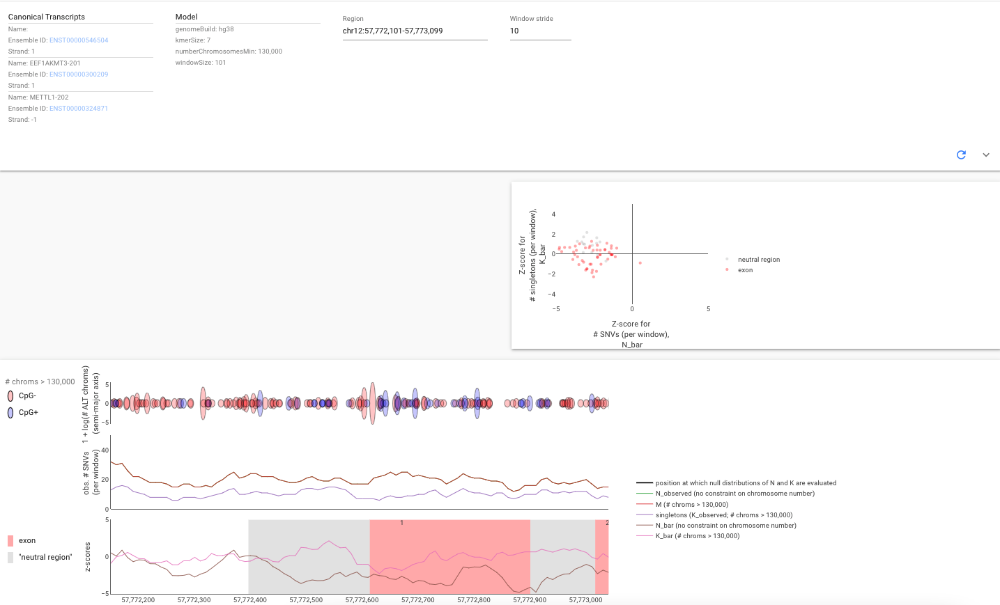

In [5]:
Image(filename='outlier based upon Nbar alone.png', width=image_width)

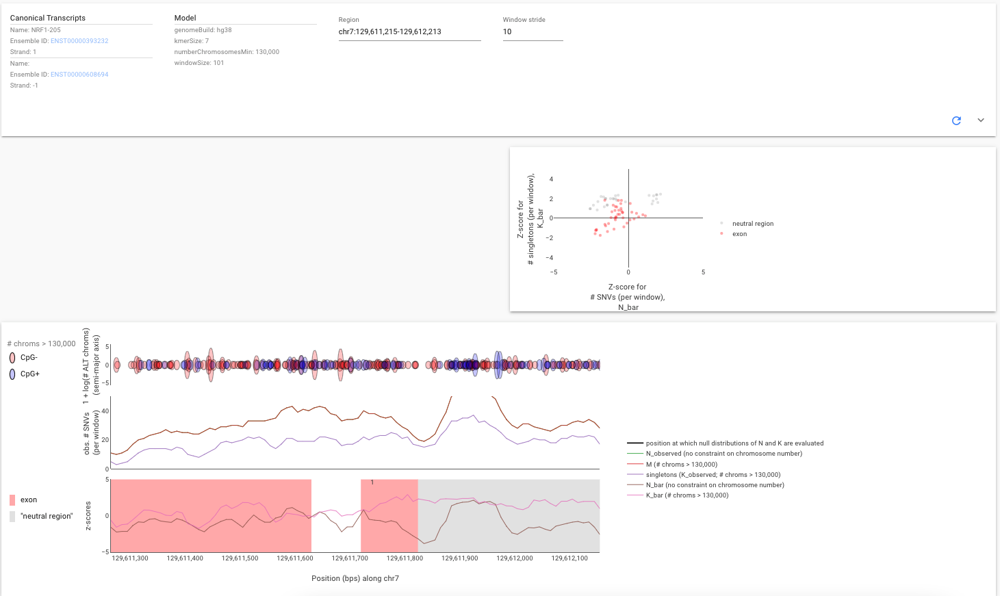

In [6]:
Image(filename='outlier based upon Kbar alone.png', width=image_width)

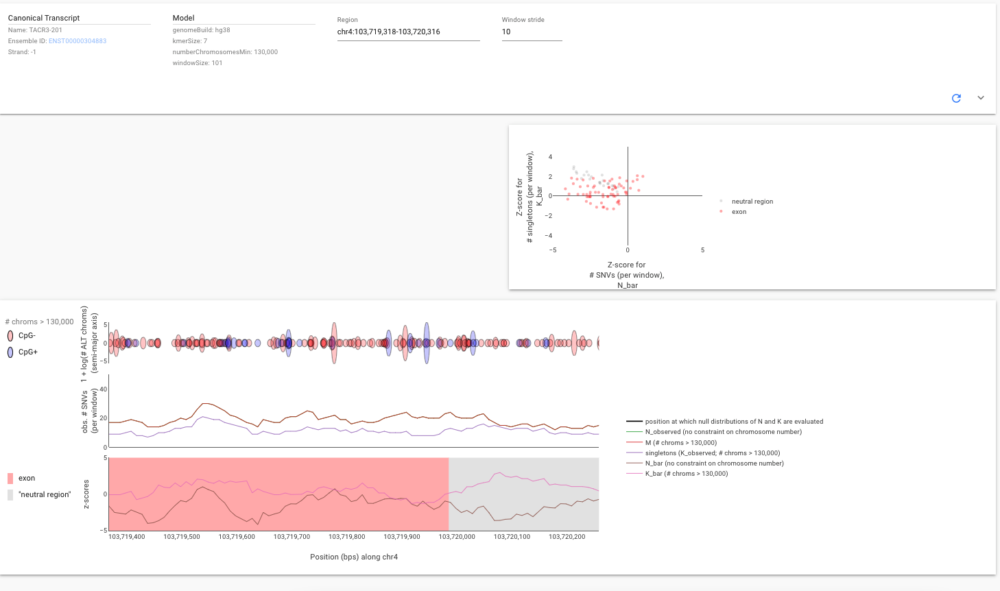

In [7]:
Image(filename='outlier based upon Nbar and Kbar.png', width=image_width)